## 기본 세팅

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import json

plt.style.use('seaborn-v0_8-darkgrid')

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

# Time Series
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

import torch
import torch.nn as nn
import torch.nn.functional as F

# Metrics
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

import pprint

In [2]:
from matplotlib.pylab import rcParams
%matplotlib inline

In [3]:
TEST_DATA_PATH = '../data/origin/test/'
TRAIN_DATA_PATH = '../data/origin/train/'

# instead of weather_station_to_county_mapping.csv, use fabiendaniels-mapping-locations-and-county-codes
# https://www.kaggle.com/datasets/michaelo/fabiendaniels-mapping-locations-and-county-codes/data
county_mapper = '../data/origin/county_lon_lats.csv'

test_csv = f'{TEST_DATA_PATH}test.csv'
test_client_csv = f'{TEST_DATA_PATH}client.csv'
test_electricity_prices_csv = f'{TEST_DATA_PATH}electricity_prices.csv'
test_forecast_weather_csv = f'{TEST_DATA_PATH}forecast_weather.csv'
test_gas_prices_csv = f'{TEST_DATA_PATH}gas_prices.csv'
test_historical_weather_csv = f'{TEST_DATA_PATH}historical_weather.csv'
# test_weather_station_to_county_mapping_csv = f'{TEST_DATA_PATH}weather_station_to_county_mapping.csv'
# test_county_id_to_name_map_json = f'{TEST_DATA_PATH}county_id_to_name_map.json'

train_csv = f'{TRAIN_DATA_PATH}train.csv'
train_client_csv = f'{TRAIN_DATA_PATH}client.csv'
train_electricity_prices_csv = f'{TRAIN_DATA_PATH}electricity_prices.csv'
train_forecast_weather_csv = f'{TRAIN_DATA_PATH}forecast_weather.csv'
train_gas_prices_csv = f'{TRAIN_DATA_PATH}gas_prices.csv'
train_historical_weather_csv = f'{TRAIN_DATA_PATH}historical_weather.csv'
# train_weather_station_to_county_mapping_csv = f'{TRAIN_DATA_PATH}weather_station_to_county_mapping.csv'
# train_county_id_to_name_map_json = f'{TRAIN_DATA_PATH}county_id_to_name_map.json'

In [4]:
df_train = pd.read_csv(train_csv)
df_train.head()

,county,is_business,product_type,target,is_consumption,datetime,data_block_id,row_id,prediction_unit_id
0,0,0,1,0.713,0,2021-09-01 00:00:00,0,0,0
1,0,0,1,96.590,1,2021-09-01 00:00:00,0,1,0
2,0,0,2,0.000,0,2021-09-01 00:00:00,0,2,1
3,0,0,2,17.314,1,2021-09-01 00:00:00,0,3,1
4,0,0,3,2.904,0,2021-09-01 00:00:00,0,4,2


In [5]:
df_train.info()
df_train.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2018352 entries, 0 to 2018351
Data columns (total 9 columns):
 #   Column              Dtype  
---  ------              -----  
 0   county              int64  
 1   is_business         int64  
 2   product_type        int64  
 3   target              float64
 4   is_consumption      int64  
 5   datetime            object 
 6   data_block_id       int64  
 7   row_id              int64  
 8   prediction_unit_id  int64  
dtypes: float64(1), int64(7), object(1)
memory usage: 138.6+ MB


(2018352, 9)

### 결측치 확인

In [ ]:
df_train.isna().sum()

In [ ]:
df_train[df_train['target'].isna()]

In [ ]:
df_train[df_train['target'].isna()]['county'].value_counts()

In [ ]:
df_train[df_train['target'].isna()]['is_business'].value_counts()

In [ ]:
df_train[df_train['target'].isna()]['product_type'].value_counts()

In [ ]:
df_train[df_train['target'].isna()]['is_consumption'].value_counts()

In [ ]:
df_train[df_train['target'].isna()]['datetime'].value_counts()

In [ ]:
df_train[df_train['target'].isna()].value_counts()

In [ ]:
df_train.describe().T

### 데이터 약간 핸들링

In [6]:
df_train[(df_train['datetime'] >= '2021-09-01 00:00:00') &
         (df_train['datetime'] <= '2021-09-01 23:00:00')]['datetime'].unique()

array(['2021-09-01 00:00:00', '2021-09-01 01:00:00',
       '2021-09-01 02:00:00', '2021-09-01 03:00:00',
       '2021-09-01 04:00:00', '2021-09-01 05:00:00',
       '2021-09-01 06:00:00', '2021-09-01 07:00:00',
       '2021-09-01 08:00:00', '2021-09-01 09:00:00',
       '2021-09-01 10:00:00', '2021-09-01 11:00:00',
       '2021-09-01 12:00:00', '2021-09-01 13:00:00',
       '2021-09-01 14:00:00', '2021-09-01 15:00:00',
       '2021-09-01 16:00:00', '2021-09-01 17:00:00',
       '2021-09-01 18:00:00', '2021-09-01 19:00:00',
       '2021-09-01 20:00:00', '2021-09-01 21:00:00',
       '2021-09-01 22:00:00', '2021-09-01 23:00:00'], dtype=object)

In [7]:
# date형식 변환
df_train['datetime'] = pd.to_datetime(df_train['datetime'])

In [41]:
# target 결측치 채우기
# TODO: 결측치 채우는 방법 추가로 고민하기
# df_train['target'].fillna(df_train['target'].median(), inplace=True)
# TODO: 결측치를, prediction_unit_id, is_consumption에 따라서 값을 채우도록..

# 'prediction_unit_id'와 'is_consumption' 그룹별로 결측치를 median으로 채우기
df_train['target'] = df_train.groupby(['prediction_unit_id', 'is_consumption'])['target'].transform(lambda x: x.fillna(x.median()))


## 이 부분 부터는 연습시작

In [9]:
# 처음에 모델을 나눴던 방식인데 굳이 이렇게 할필요가 없을거같기도
df_arima_00_0_0_p = df_train[(df_train['is_consumption'] == 0) &
         (df_train['county'] == 0) &
         (df_train['is_business'] == 0) &
         (df_train['product_type'] == 0)][['datetime', 'target']].set_index('datetime').copy()

df_arima_00_0_0_c = df_train[(df_train['is_consumption'] == 1) &
         (df_train['county'] == 0) &
         (df_train['is_business'] == 0) &
         (df_train['product_type'] == 0)][['datetime', 'target']].set_index('datetime').copy()

df_arima_00_0_1_p = df_train[(df_train['is_consumption'] == 0) &
         (df_train['county'] == 0) &
         (df_train['is_business'] == 0) &
         (df_train['product_type'] == 1)][['datetime', 'target']].set_index('datetime').copy()

df_arima_00_0_1_c = df_train[(df_train['is_consumption'] == 1) &
         (df_train['county'] == 0) &
         (df_train['is_business'] == 0) &
         (df_train['product_type'] == 0)][['datetime', 'target']].set_index('datetime').copy()

In [37]:
import pandas as pd

def create_dataframe(df_train, county, is_business, product_type, is_consumption):
    condition = (
        (df_train['is_consumption'] == is_consumption) &
        (df_train['county'] == county) &
        (df_train['is_business'] == is_business) &
        (df_train['product_type'] == product_type)
    )
    df_name = f'df_arima_{county:02d}_{is_business}_{product_type}_{"c" if is_consumption == 1 else "p"}'
    return df_name, df_train[condition][['datetime', 'target']].set_index('datetime').copy()

# 원하는 데이터프레임 생성
df_dict = {}
county_range = 16
is_business_range = 2
product_type_range = 4

for county in range(county_range):
    for is_business in range(is_business_range):
        for product_type in range(product_type_range):
            for is_consumption in [0, 1]:
                df_name, df_data = create_dataframe(df_train, county, is_business, product_type, is_consumption)

                # 결측치는 각 모델별로 생성..을 하면서 median으로 채우게했습니다
                median_value = df_data['target'].median()
                df_data['target'].fillna(median_value, inplace=True)

                df_dict[df_name] = df_data

# 예시로 몇 개의 데이터프레임만 출력
for key, value in df_dict.items():
    print(f"{key}:\n{value.head()}\n")


df_arima_00_0_0_p:
Empty DataFrame
Columns: [target]
Index: []

df_arima_00_0_0_c:
Empty DataFrame
Columns: [target]
Index: []

df_arima_00_0_1_p:
                     target
datetime                   
2021-09-01 00:00:00   0.713
2021-09-01 01:00:00   1.132
2021-09-01 02:00:00   0.490
2021-09-01 03:00:00   0.496
2021-09-01 04:00:00   0.149

df_arima_00_0_1_c:
                     target
datetime                   
2021-09-01 00:00:00  96.590
2021-09-01 01:00:00  77.691
2021-09-01 02:00:00  91.594
2021-09-01 03:00:00  87.955
2021-09-01 04:00:00  88.184

df_arima_00_0_2_p:
                     target
datetime                   
2021-09-01 00:00:00     0.0
2021-09-01 01:00:00     0.0
2021-09-01 02:00:00     0.0
2021-09-01 03:00:00     0.0
2021-09-01 04:00:00     0.0

df_arima_00_0_2_c:
                     target
datetime                   
2021-09-01 00:00:00  17.314
2021-09-01 01:00:00  15.872
2021-09-01 02:00:00  16.510
2021-09-01 03:00:00  14.271
2021-09-01 04:00:00  18.225

df_arima

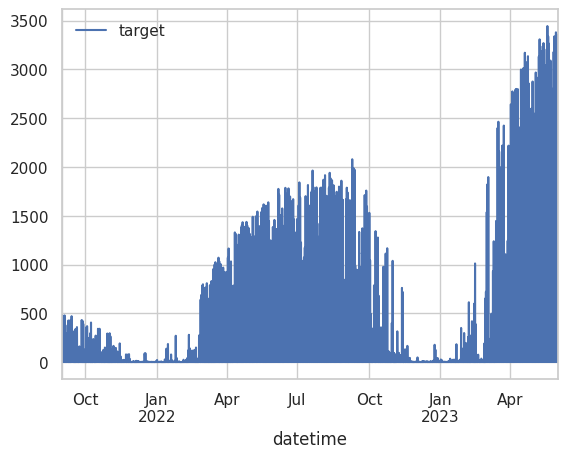

In [38]:
df_arima_00_0_1_p.plot()
plt.show()

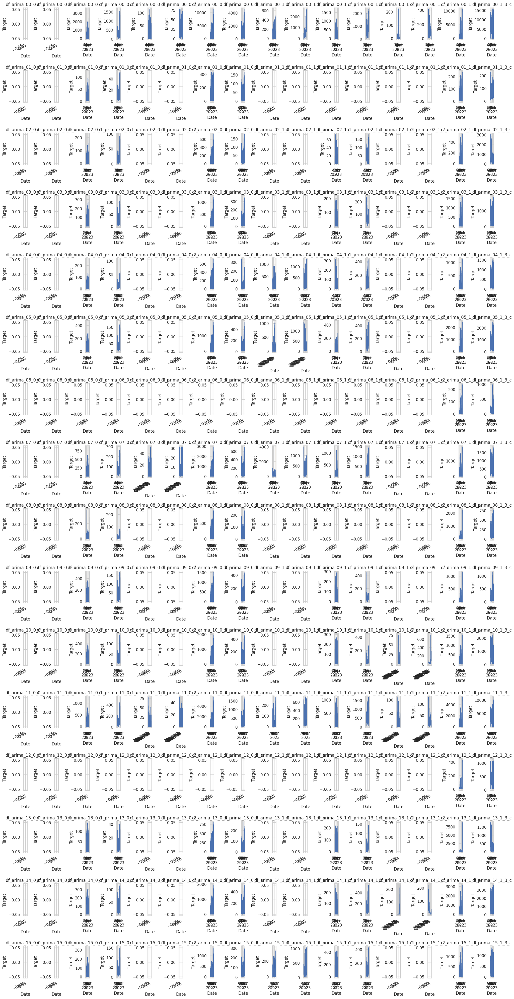

In [40]:
# subplot 설정
num_rows = 16
num_cols = 2 * 2 * 4  # is_business_range * product_type_range
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 40))

# 각 데이터프레임을 subplot에 플로팅
for county in range(16):
    for is_business in range(2):
        for product_type in range(4):
            for is_consumption in [0, 1]:
                df_name = f'df_arima_{county:02d}_{is_business}_{product_type}_{"c" if is_consumption == 1 else "p"}'
                row_idx = county
                col_idx = (is_business * product_type_range + product_type) * 2 + is_consumption
                ax = axes[row_idx, col_idx]

                df_dict[df_name]['target'].plot(ax=ax, title=df_name)
                ax.set_xlabel('Date')
                ax.set_ylabel('Target')

# 레이아웃 조정
plt.tight_layout()
plt.show()


In [13]:
# 각 데이터프레임의 조건을 텍스트로 출력
for county in range(16):
    for is_business in range(2):
        for product_type in range(4):
            for is_consumption in [0, 1]:
                df_name = f'df_arima_{county:02d}_{is_business}_{product_type}_{"c" if is_consumption == 1 else "p"}'

                if not df_dict[df_name].empty:  # 데이터가 비어 있지 않은 경우
                    conditions = f'County: {county}, Business: {is_business}, Product: {product_type}, Consumption: {is_consumption}'
                    print(f'{df_name}: {conditions}')

df_arima_00_0_1_p: County: 0, Business: 0, Product: 1, Consumption: 0
df_arima_00_0_1_c: County: 0, Business: 0, Product: 1, Consumption: 1
df_arima_00_0_2_p: County: 0, Business: 0, Product: 2, Consumption: 0
df_arima_00_0_2_c: County: 0, Business: 0, Product: 2, Consumption: 1
df_arima_00_0_3_p: County: 0, Business: 0, Product: 3, Consumption: 0
df_arima_00_0_3_c: County: 0, Business: 0, Product: 3, Consumption: 1
df_arima_00_1_0_p: County: 0, Business: 1, Product: 0, Consumption: 0
df_arima_00_1_0_c: County: 0, Business: 1, Product: 0, Consumption: 1
df_arima_00_1_1_p: County: 0, Business: 1, Product: 1, Consumption: 0
df_arima_00_1_1_c: County: 0, Business: 1, Product: 1, Consumption: 1
df_arima_00_1_2_p: County: 0, Business: 1, Product: 2, Consumption: 0
df_arima_00_1_2_c: County: 0, Business: 1, Product: 2, Consumption: 1
df_arima_00_1_3_p: County: 0, Business: 1, Product: 3, Consumption: 0
df_arima_00_1_3_c: County: 0, Business: 1, Product: 3, Consumption: 1
df_arima_01_0_1_p: C

In [14]:
# 데이터가 있는 경우에만 my_prediction_unit_id 부여
my_prediction_unit_id = 0
for county in range(16):
    for is_business in range(2):
        for product_type in range(4):
            for is_consumption in [0, 1]:
                df_name = f'df_arima_{county:02d}_{is_business}_{product_type}_{"c" if is_consumption == 1 else "p"}'

                if not df_dict[df_name].empty:  # 데이터가 비어 있지 않은 경우
                    conditions = f'County: {county}, Business: {is_business}, Product: {product_type}, Consumption: {is_consumption}'
                    print(f'my_prediction_unit_id: {my_prediction_unit_id}, {df_name}: {conditions}')
                    my_prediction_unit_id += 1


my_prediction_unit_id: 0, df_arima_00_0_1_p: County: 0, Business: 0, Product: 1, Consumption: 0
my_prediction_unit_id: 1, df_arima_00_0_1_c: County: 0, Business: 0, Product: 1, Consumption: 1
my_prediction_unit_id: 2, df_arima_00_0_2_p: County: 0, Business: 0, Product: 2, Consumption: 0
my_prediction_unit_id: 3, df_arima_00_0_2_c: County: 0, Business: 0, Product: 2, Consumption: 1
my_prediction_unit_id: 4, df_arima_00_0_3_p: County: 0, Business: 0, Product: 3, Consumption: 0
my_prediction_unit_id: 5, df_arima_00_0_3_c: County: 0, Business: 0, Product: 3, Consumption: 1
my_prediction_unit_id: 6, df_arima_00_1_0_p: County: 0, Business: 1, Product: 0, Consumption: 0
my_prediction_unit_id: 7, df_arima_00_1_0_c: County: 0, Business: 1, Product: 0, Consumption: 1
my_prediction_unit_id: 8, df_arima_00_1_1_p: County: 0, Business: 1, Product: 1, Consumption: 0
my_prediction_unit_id: 9, df_arima_00_1_1_c: County: 0, Business: 1, Product: 1, Consumption: 1
my_prediction_unit_id: 10, df_arima_00_1

In [ ]:
# my_prediction_unit_id 부여 해보ㅠ려고 했는데 이건 실제 prediction_unit_id와 일치하지 않더라 좀 이상한
my_prediction_unit_id = 0
for county in range(16):
    for is_business in range(2):
        for product_type in range(4):
            for is_consumption in [0, 1]:
                df_name = f'df_arima_{county:02d}_{is_business}_{product_type}_{"c" if is_consumption == 1 else "p"}'

                if not df_dict[df_name].empty:  # 데이터가 비어 있지 않은 경우
                    conditions = f'County: {county}, Business: {is_business}, Product: {product_type}, Consumption: {is_consumption}'
                    print(f'my_prediction_unit_id: {my_prediction_unit_id}, {df_name}: {conditions}')
                    
                    # consumption이 번갈아가면서 나오는 경우에만 my_prediction_unit_id 증가
                    if is_consumption == 1:
                        my_prediction_unit_id += 1


In [15]:
# 막 61번 prediction_unit_id 부터는 순서가 좀 이상이상..
unique_rows = df_train[['county', 'is_business', 'product_type', 'prediction_unit_id']].drop_duplicates()

pd.set_option('display.max_rows', None)
# 전체 행 출력
print(unique_rows[:])


         county  is_business  product_type  prediction_unit_id
0             0            0             1                   0
2             0            0             2                   1
4             0            0             3                   2
6             0            1             0                   3
8             0            1             1                   4
10            0            1             3                   5
12            1            0             1                   6
14            1            0             3                   7
16            1            1             3                   8
18            2            0             3                   9
20            2            1             3                  10
22            3            0             1                  11
24            3            0             3                  12
26            3            1             1                  13
28            3            1             3             

아 참고로 county, is_business, product_type, is_consumpstion 순으로<br/>
임의로 prediction_unit_id를 매겨봤는데,<br/>
이거 p_u_id indexing이 c끼리 다 나타낸뒤, p끼리 되는지, 아니면 번갈아가면서 되는건지 확인이 필요한것 같습니다<br/>
지금 다시 보니, 좀 뒤죽박죽.. 특히 61번 부터 뭐 규칙이 이상함

이 말이 county별, p_u_id별 plot인가 싶네요

## 여기까지 연습끝

County별 consumption, production 기존에 해본 틀을 가지고 해봤는데 한눈에 잘 비교가 어려운듯

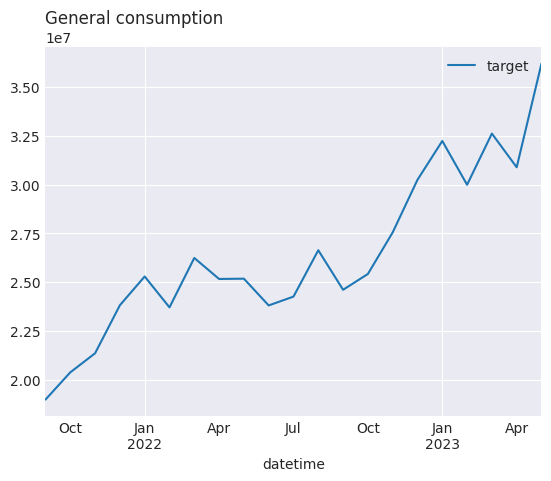

In [16]:
# TODO: datetime set index해서 group by하는데 모든 target sum해서 함
df_train.set_index('datetime').groupby(pd.Grouper(freq='MS'))[['target']].sum().plot()
plt.title('General consumption', loc='left')
plt.show()

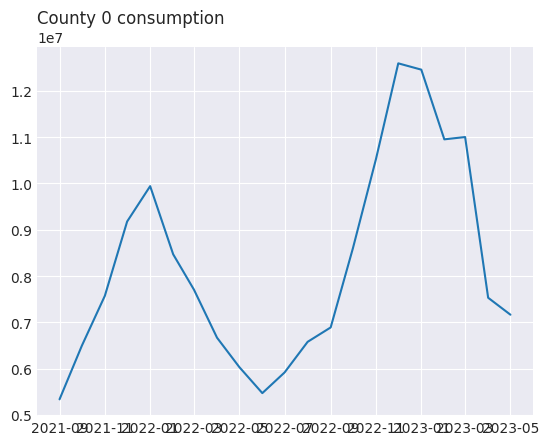

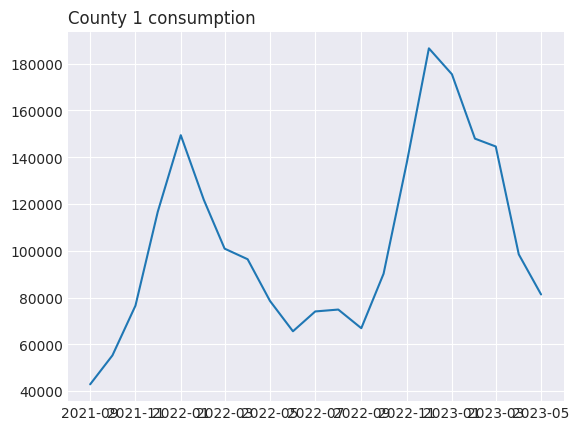

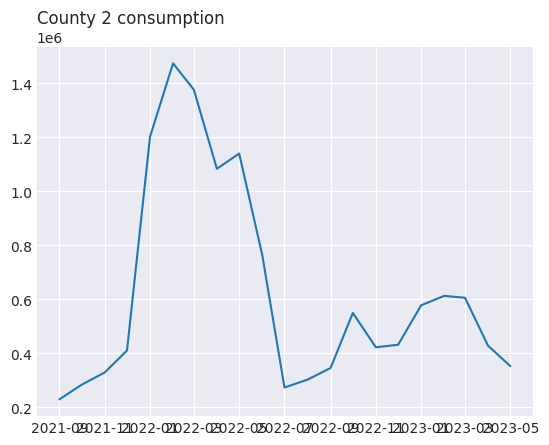

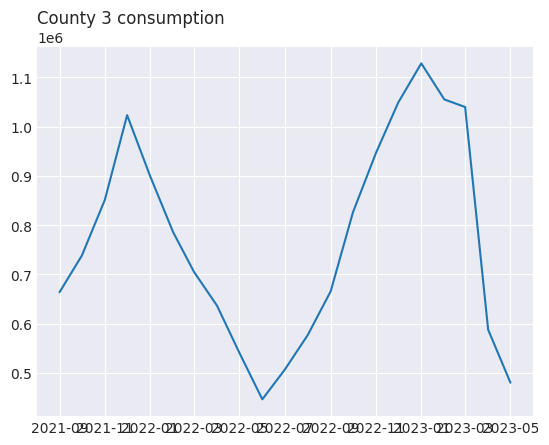

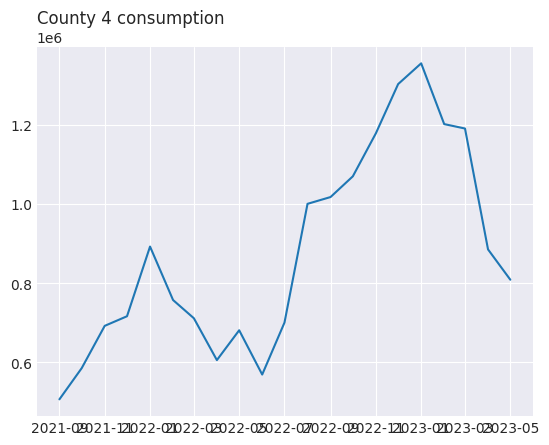

...

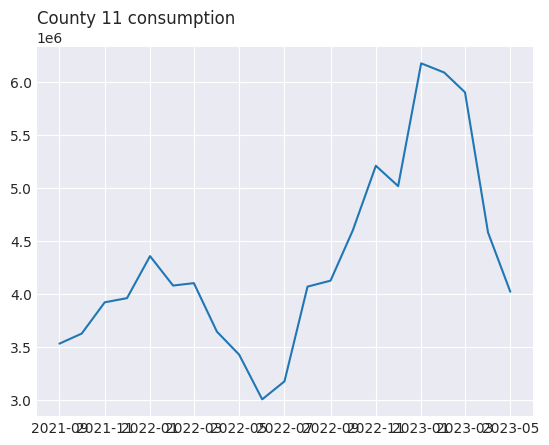

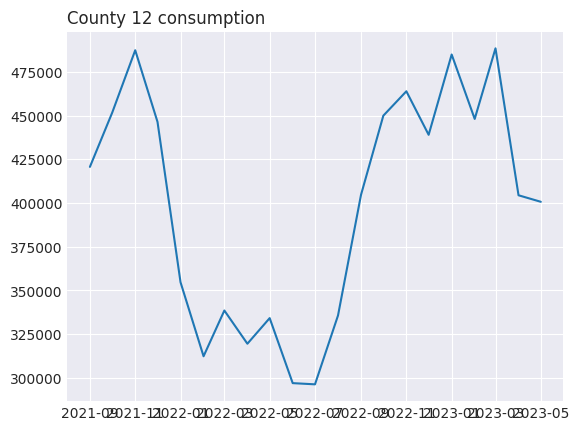

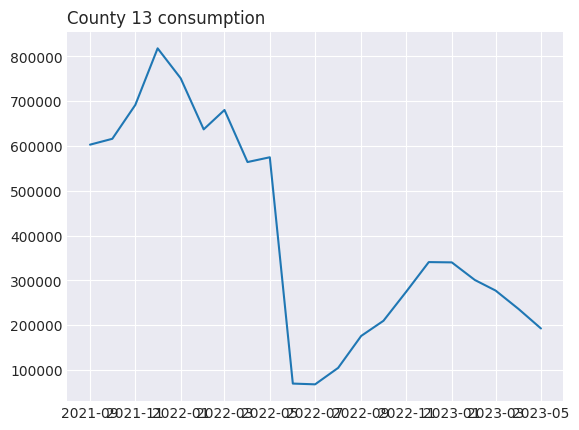

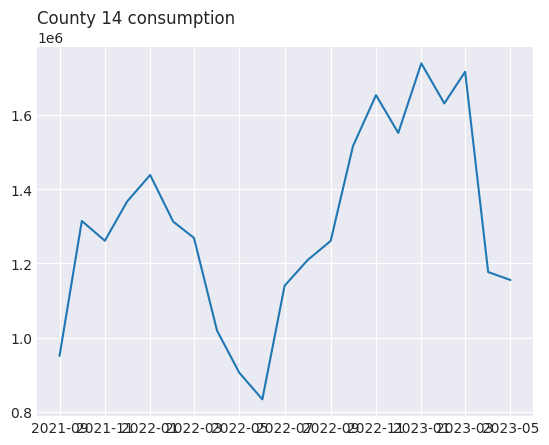

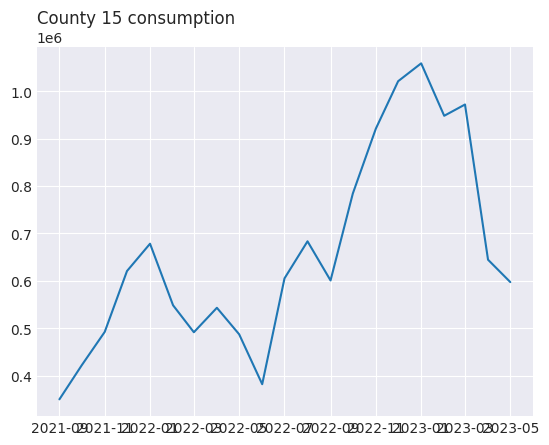

In [17]:
# County 별 consumption plot
for county in df_train['county'].unique():
    plt.title(f'County {county} consumption', fontsize=12, loc='left')
    df_fill_group = df_train.query('county == @county').query('is_consumption == 1').set_index('datetime')[['target']].groupby(pd.Grouper(freq='MS')).sum().copy()
    plt.plot(df_fill_group.index, df_fill_group['target'])
    plt.show()

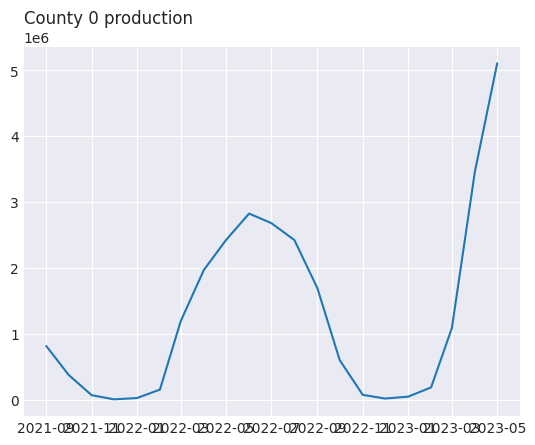

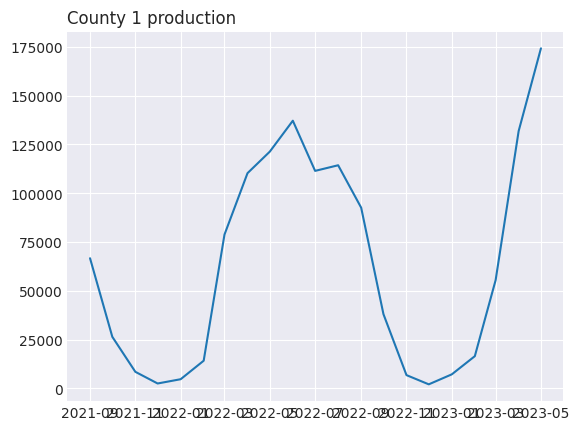

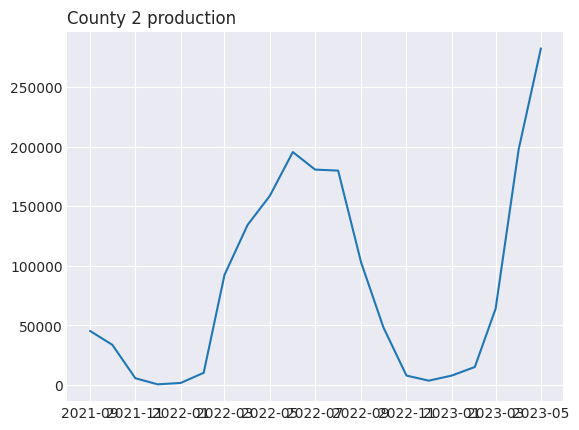

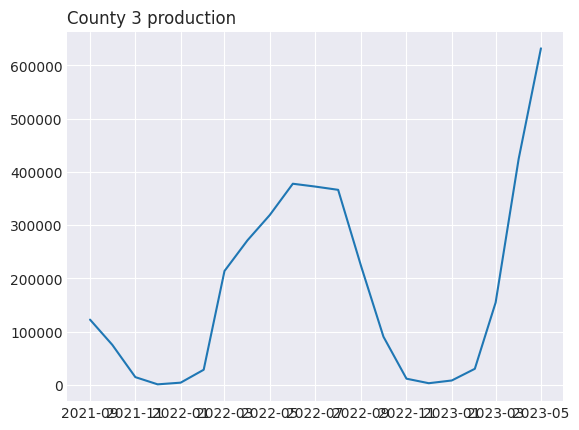

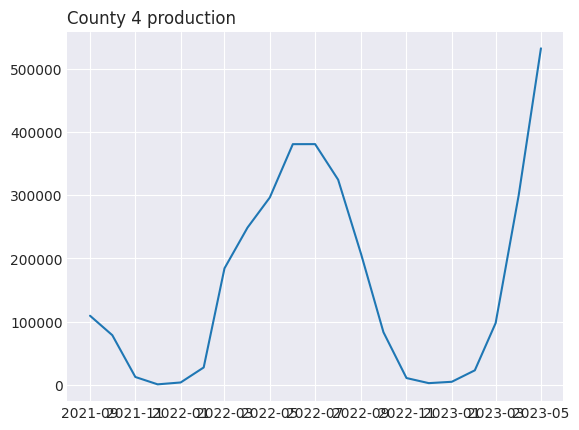

...

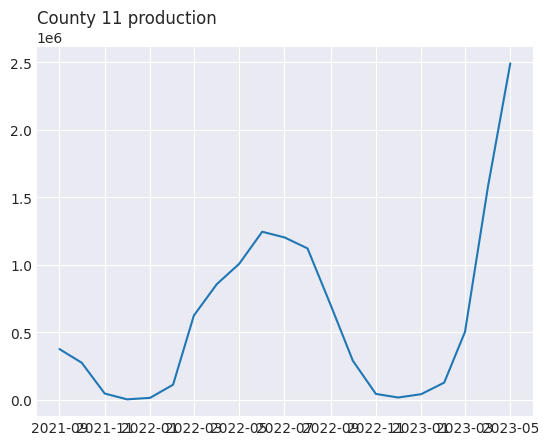

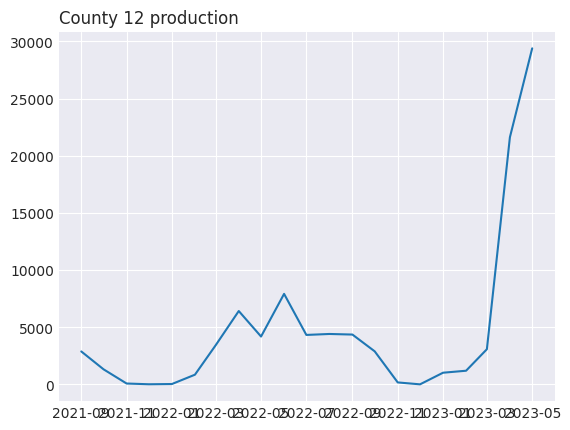

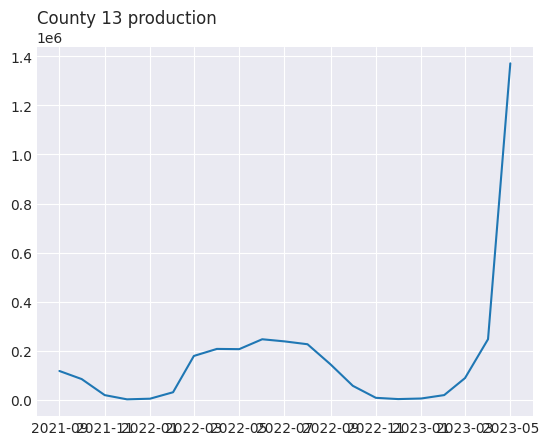

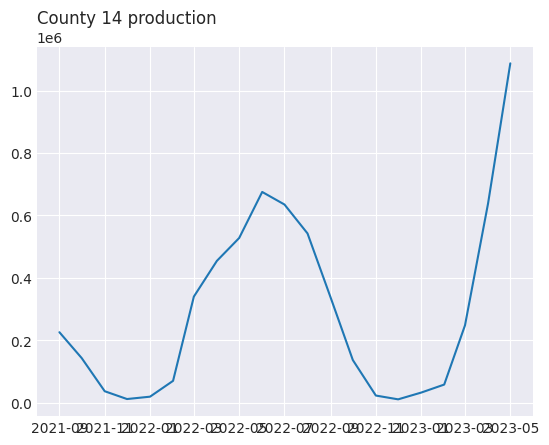

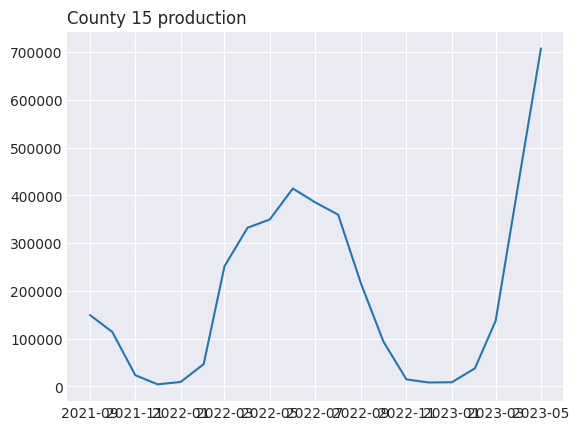

In [18]:
# County 별 production plot
for county in df_train['county'].unique():
    plt.title(f'County {county} production', fontsize=12, loc='left')
    df_fill_group = df_train.query('county == @county').query('is_consumption == 0').set_index('datetime')[['target']].groupby(pd.Grouper(freq='MS')).sum().copy()
    plt.plot(df_fill_group.index, df_fill_group['target'])
    plt.show()

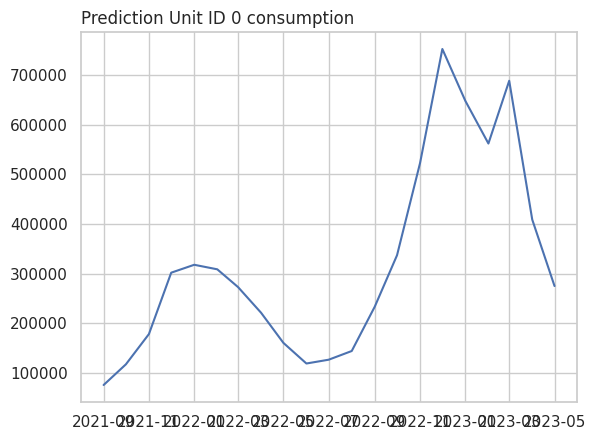

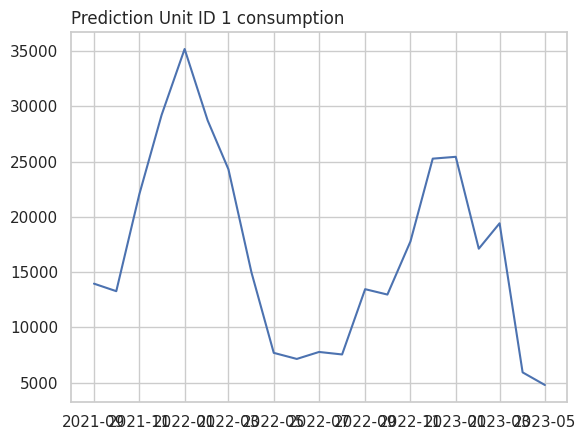

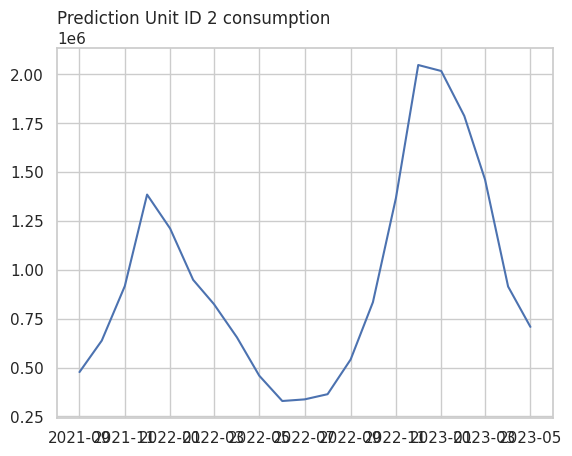

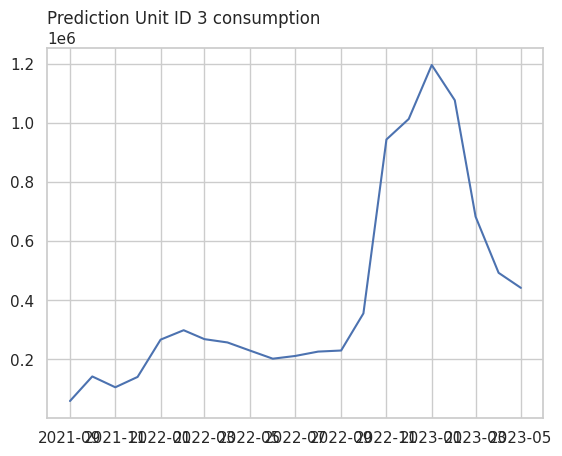

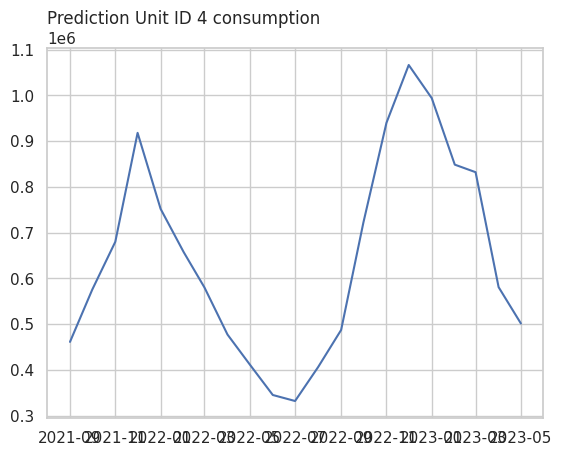

...

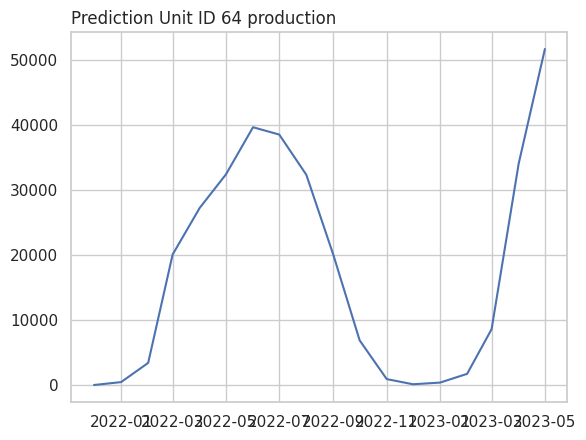

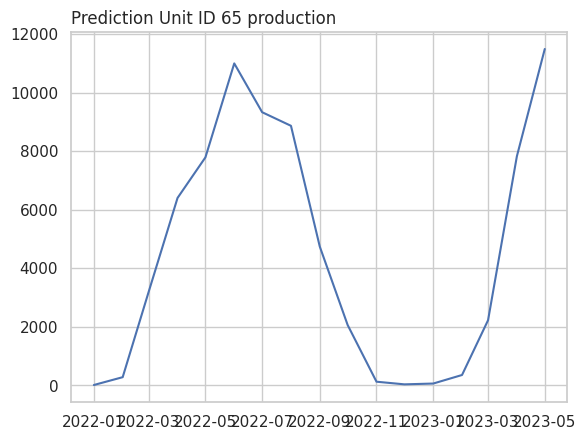

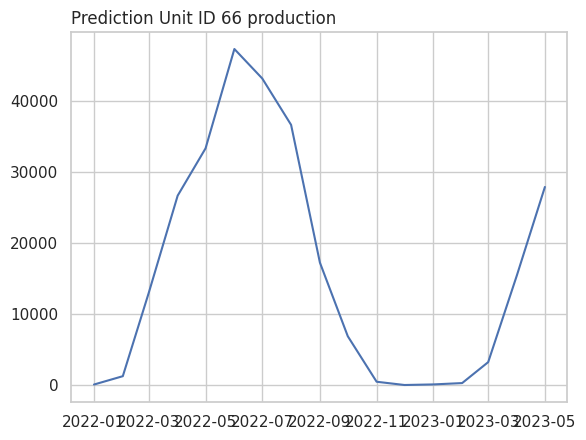

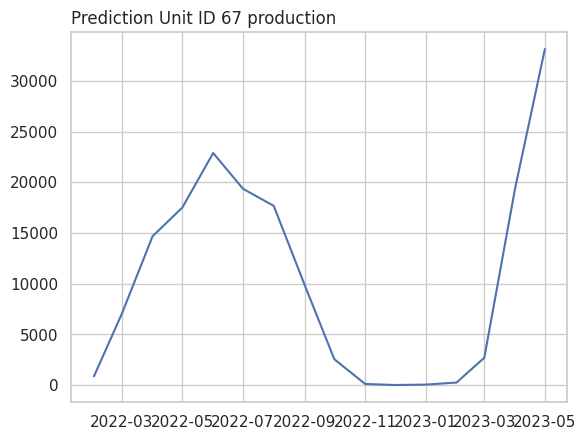

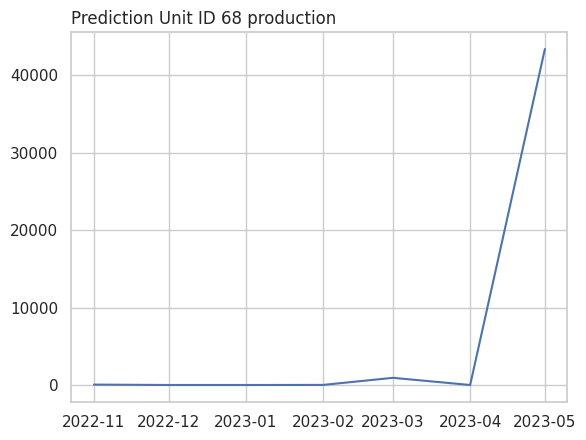

In [36]:
# prediction_unit_id 별 consumption plot
for prediction_unit_id in range(69):
    plt.title(f'Prediction Unit ID {prediction_unit_id} consumption', fontsize=12, loc='left')
    df_fill_group = df_train.query('prediction_unit_id == @prediction_unit_id').query('is_consumption == 1').set_index('datetime')[['target']].groupby(pd.Grouper(freq='MS')).sum().copy()
    plt.plot(df_fill_group.index, df_fill_group['target'])
    plt.show()

# prediction_unit_id 별 production plot
for prediction_unit_id in range(69):
    plt.title(f'Prediction Unit ID {prediction_unit_id} production', fontsize=12, loc='left')
    df_fill_group = df_train.query('prediction_unit_id == @prediction_unit_id').query('is_consumption == 0').set_index('datetime')[['target']].groupby(pd.Grouper(freq='MS')).sum().copy()
    plt.plot(df_fill_group.index, df_fill_group['target'])
    plt.show()


Column수 별로 plot을 작성해봄

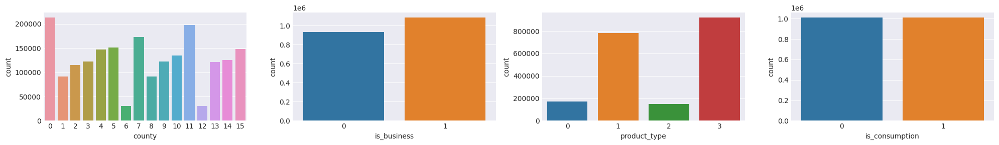

In [19]:
# counts for the country,store,product
desc_columns = ['county','is_business','product_type','is_consumption']

fig, axs = plt.subplots(1, len(desc_columns), figsize=(5*len(desc_columns), 3))

for i, column in enumerate(desc_columns):
    _ = sns.countplot(df_train, x=column, ax=axs[i])

_ = fig.tight_layout()

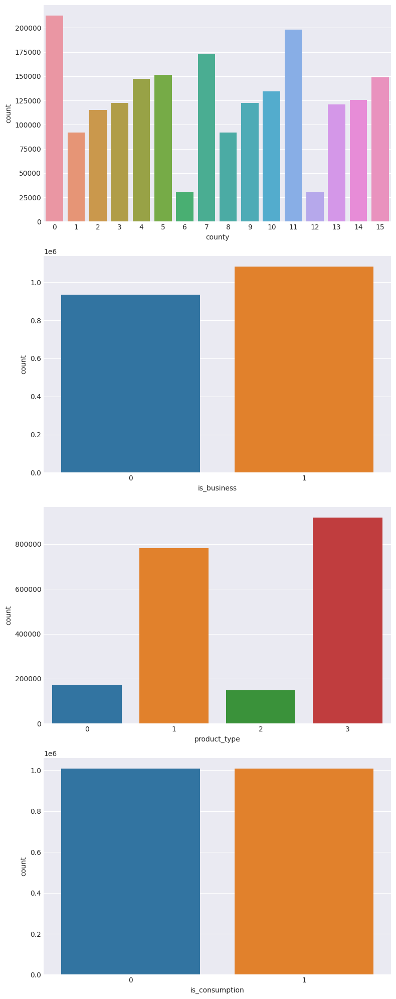

In [20]:
# 아 아까꺼 다시 세로로 작성해봄 counts for the country, store, product
desc_columns = ['county', 'is_business', 'product_type', 'is_consumption']

fig, axs = plt.subplots(len(desc_columns), 1, figsize=(8, 5 * len(desc_columns)))

for i, column in enumerate(desc_columns):
    sns.countplot(x=column, data=df_train, ax=axs[i])

plt.tight_layout()
plt.show()


production, consumption 전체 plot

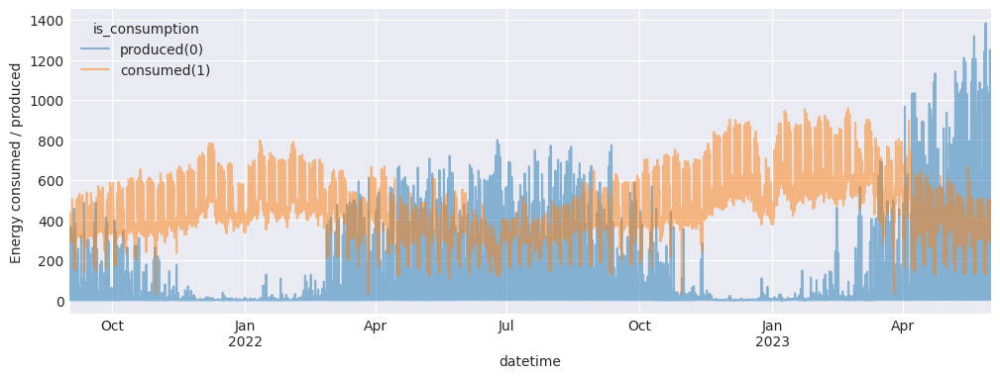

In [21]:
train_avgd = (
    df_train
    .groupby(['datetime','is_consumption'])
    ['target'].mean()
    .unstack()
    .rename({0: 'produced(0)', 1:'consumed(1)'}, axis=1)
)

fig, ax = plt.subplots(1, 1, figsize=(12, 4))
_ = train_avgd.plot(ax=ax, alpha=0.5)
_ = ax.set_ylabel('Energy consumed / produced')

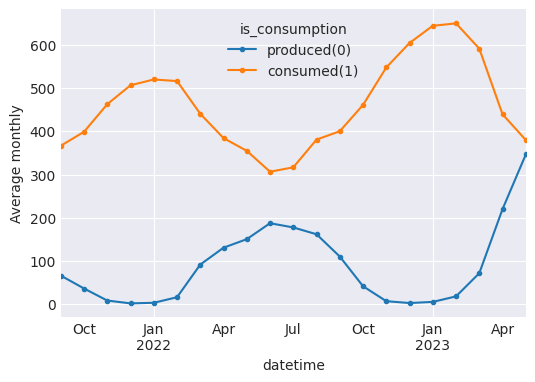

In [22]:
# 월 별로 평균을 내서 월별로 묶어서 plot
fig,ax = plt.subplots(1,1,figsize=(6,4))
_ = train_avgd.resample('M').mean().plot(ax=ax, marker='.')
_ = ax.set_ylabel('Average monthly')

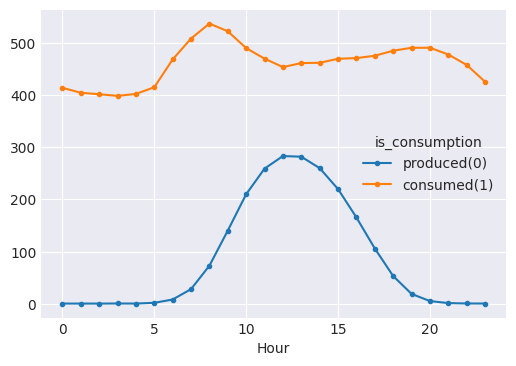

In [23]:
# 하루에서 평균을 낸것 시간대별 plot
fig,ax = plt.subplots(1,1,figsize=(6,4))
train_avgd.groupby(train_avgd.index.hour).mean().plot(ax=ax, marker='.')
_ = ax.set_xlabel('Hour')

In [24]:
# 앗 이제서야 다시 확인해보는 통계적 상황들..
print("\nTrain Data Statistics:")
print(df_train.describe())


Train Data Statistics:
             county   is_business  product_type        target  is_consumption  \
count  2.018352e+06  2.018352e+06  2.018352e+06  2.018352e+06       2018352.0   
mean   7.297034e+00  5.368261e-01  1.898927e+00  2.747918e+02             0.5   
min    0.000000e+00  0.000000e+00  0.000000e+00  0.000000e+00             0.0   
25%    3.000000e+00  0.000000e+00  1.000000e+00  3.790000e-01             0.0   
50%    7.000000e+00  1.000000e+00  2.000000e+00  3.113300e+01             0.5   
75%    1.100000e+01  1.000000e+00  3.000000e+00  1.801140e+02             1.0   
max    1.500000e+01  1.000000e+00  3.000000e+00  1.548027e+04             1.0   
std    4.780990e+00  4.986421e-01  1.081766e+00  9.093919e+02             0.5   

                            datetime  data_block_id        row_id  \
count                        2018352   2.018352e+06  2.018352e+06   
mean   2022-07-20 08:29:25.326166016   3.218746e+02  1.009176e+06   
min              2021-09-01 00:00:00   

/home/estsoft/miniconda3/envs/MathAI/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


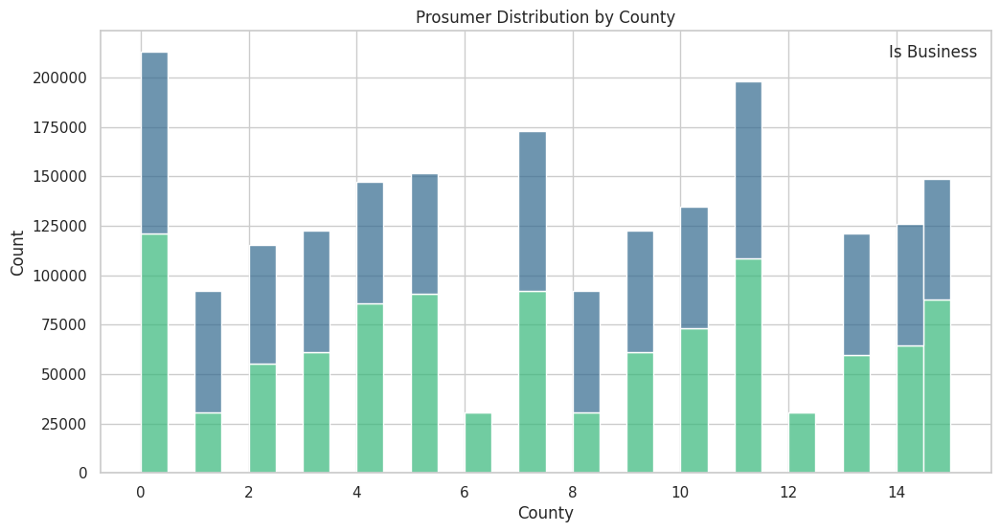

In [25]:
# Prosumer county별 분배 확인
sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.histplot(data=df_train, x='county', hue='is_business', multiple='stack', bins=30, palette='viridis', alpha=0.7)

plt.xlabel('County')
plt.ylabel('Count')
plt.title('Prosumer Distribution by County')

plt.legend(title='Is Business', loc='upper right')

plt.show()

In [26]:
cols = [c for c in df_train.columns if c not in ["datetime", "date"]]

correlation_matrix = df_train[cols].corr()

fig = px.imshow(correlation_matrix,
                labels=dict(x="Features", y="Features", color="Correlation"),
                x=cols,
                y=cols,
                color_continuous_scale="Viridis",
                title="Correlation Heatmap")

fig.show()

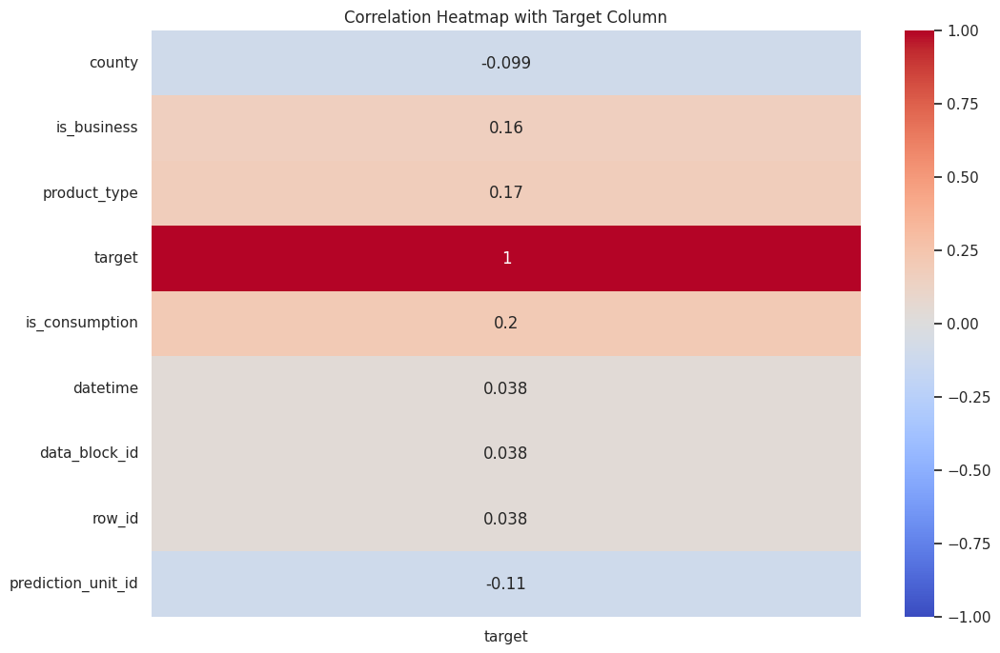

In [27]:
def cal_corr(df):
    correlation_matrix = df.corr()
    # Extract correlations with the 'target' column
    target_correlation = correlation_matrix['target']
    # Plotting the heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(target_correlation.to_frame(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Heatmap with Target Column')
    plt.show()

cal_corr(df_train)

자 이제 seasonality 이런거 조사할건데
target이 시간이 지나감에 따라 증가하는 것 같은 trend가 있다고 판단되고 아직 stationary하지 않아보입니다

In [28]:
### seperate (production) and (consumption)
df_table = df_train.drop(columns=['target','is_consumption','row_id']).drop_duplicates()
df_table['production'] = df_train.query("is_consumption==0")['target'].values
df_table['consumption'] = df_train.query("is_consumption==1")['target'].values

# table pivot
target_pivot = df_table.pivot_table(
    index='datetime',columns=['county','is_business','product_type'],
    values=['consumption','production']
    )
target_pivot.head(2)


consumption                                                \
county                       0                                                  
is_business                   0                      1                          
product_type                  1       2        3     0        1   2         3   
datetime                                                                        
2021-09-01 00:00:00      96.590  17.314  656.859  59.0  501.760 NaN  5155.056   
2021-09-01 01:00:00      77.691  15.872  595.498  61.6  486.297 NaN  4953.258   

                                            ... production                \
county                  1                   ...         14                 
is_business              0               1  ...          0         1       
product_type             1       3       3  ...          1    3    1   2   
datetime                                    ...                            
2021-09-01 00:00:00  2.756  22.841  30.778  ...        0.0  0.0  0.0 NaN   
2021-09-01 01:00:00  2.808  21.158  30.468  ...        0.0  0.0  0.0 NaN   

                                                    
county                       15                     
is_business                   0        1            
product_type             3    1    3   0    1    3  
datetime                                            
2021-09-01 00:00:00  0.000  0.0  0.0 NaN  0.1  0.0  
2021-09-01 01:00:00  9.031  0.0  0.0 NaN  0.1  0.0  

[2 rows x 138 columns]

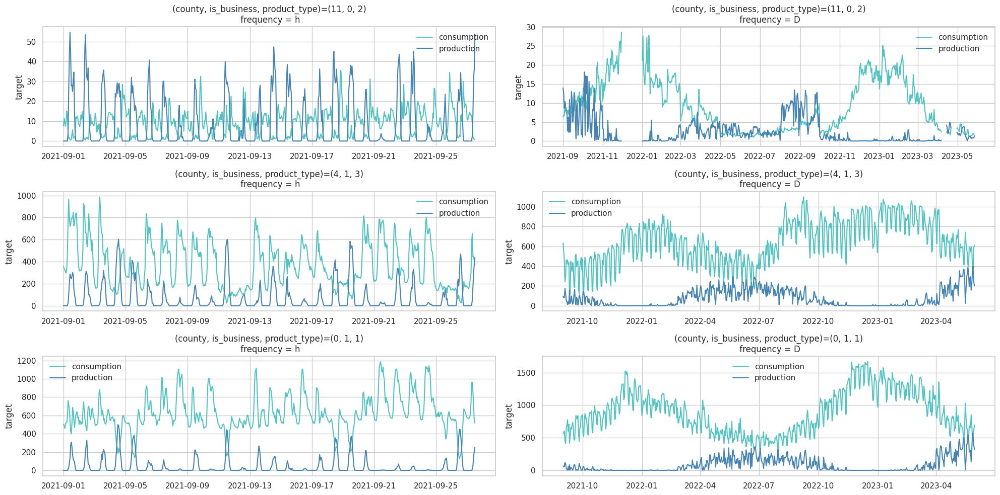

In [30]:
# sample로 임의로 구성해서, consumption, production 뽑아보기
fig, axes = plt.subplots(3,2,figsize=(20,10))
color_set = ['#51c4c2','#4583b3','#be86ba','#f78e26',]

for ax_row, sample_segment_id in enumerate(np.random.randint(0,68,3)):
    for ax, time_freq in zip(axes[ax_row,:],['h','D']):
        temp_table = target_pivot.iloc[:,[sample_segment_id,sample_segment_id+69]]
        temp_table = temp_table.groupby(target_pivot.index.values.astype(f'datetime64[{time_freq}]')).mean()
        temp_table = temp_table.iloc[:637,]

        ax.plot(temp_table['consumption'],color = color_set[0],label = 'consumption')
        ax.plot(temp_table['production'],color = color_set[1],label = 'production')
        ax.set(
            title=f'(county, is_business, product_type)={temp_table.columns[0][1:]}\n frequency = {time_freq}',
            ylabel = 'target'
            )
        ax.legend()
plt.tight_layout()

# TODO: prdection_unit_id로 바꿔서 뽑아보기

In [32]:
# Feature importance를 계산해보고 싶어서 그만.. randomforest들고와봤는데 괜찮나요?
from sklearn.ensemble import RandomForestRegressor

# Feature importance를 계산할 대상 feature들을 선택
features = ['county', 'is_business', 'product_type', 'prediction_unit_id']

# DataFrame에서 선택한 feature들과 target인 'target' column을 사용
X = df_train[features]
y = df_train['target']

# RandomForestRegressor 모델을 생성하고 학습
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)

# feature importance 출력
feature_importance = pd.DataFrame({'Feature': features, 'Importance': rf_model.feature_importances_})
print(feature_importance)


              Feature  Importance
0              county    0.093638
1         is_business    0.039316
2        product_type    0.064122
3  prediction_unit_id    0.802924


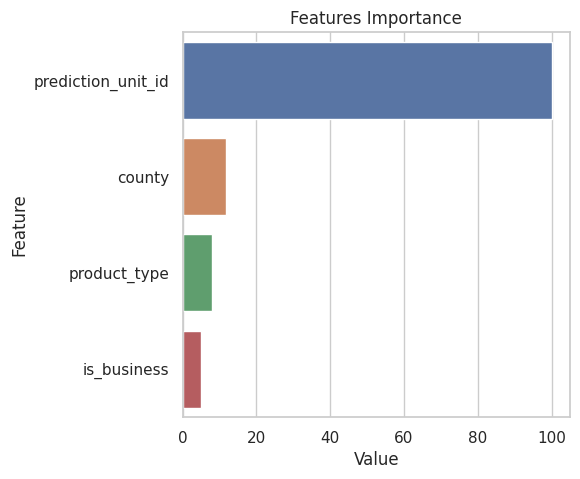

In [35]:
# Feature Importance를 계산한 결과 
Feature_Imp = pd.DataFrame(sorted(zip(rf_model.feature_importances_, features), key=lambda x: x[0], reverse=True),
                            columns=['Value', 'Feature'])
Feature_Imp['Value'] = 100 * (Feature_Imp['Value'] / Feature_Imp['Value'].max())  # Normalisation
Feature_Imp = Feature_Imp.sort_values(by='Value', ascending=False).reset_index(drop=True)

# Features Importance
if len(Feature_Imp) > 90:
    plt.figure(figsize=(7, 15))
elif len(Feature_Imp) > 60:
    plt.figure(figsize=(7, 12))
elif len(Feature_Imp) > 30:
    plt.figure(figsize=(7, 10))
else:
    plt.figure(figsize=(5, 5))

sns.barplot(x="Value", y="Feature", data=Feature_Imp.head(100))
plt.title('Features Importance')
plt.show()

# => 이부분은 좀 더, 모델 돌리고 나서랑, 데이터 머지하고 난뒤 해야할듯

In [ ]:
# TODO: county 기준, prediction uid 기준 plot

In [ ]:
# TODO: product_type, county, is_business, is_consumption 네가지 지표 기준을 달리 해보기

In [ ]:
# TODO: 어떤 사람은 FFT 써서 해보던데..오..

## 향후 방향성 생각

- datetime을 년도, 월, 일로 나눠서 dataframe을 생각해본다?
- 학습을 시킬 때, county 하나에 대해서만 학습하는 것이 아니라, 인근 county에 대해서도 학습을 시키면 어떤가
- 일단, 하나의 segment에 대해서만 실습을 해보는 것도 강사님의 추천.. 근데 다 해보고싶긴 하단 말이지